<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 20px; height: 55px">

# Capstone Project - DeFakeIt : Detecting Deepfake Audio

>Author: Gilbert

---
**Context:**

The rapid advancement of artificial intelligence (AI) technology has revolutionized audio generation, enabling the creation of remarkably realistic synthetic speech. This innovation holds tremendous potential for enhancing accessibility, language translation, and entertainment, benefiting individuals and industries worldwide. However, the same AI capabilities have been exploited for malicious purposes, leading to the proliferation of deepfake audio used in scams, misinformation campaigns, and hate speech. The ease with which AI-generated audio can impersonate individuals and manipulate recordings has raised serious concerns about authenticity and trust in digital communication channels.

This has been a problem in Singapore as well, with recent deepfake video  circulating online impersonating PM Lee voice to promote cryptocurrency investment. [Source : Straits Times Dec 2023](https://www.straitstimes.com/singapore/pm-lee-warns-against-responding-to-deepfake-videos-of-him-promoting-investment-scams)

**Problem Statement:**  

How can we develop a model to effectively detect deepfake audio recordings, distinguishing between genuine human speech and AI generated sound for ensuring audio authenticity and combating the spread of misinformation and fraudulent activities?

**Target Audience:**  

SPF Scam Division

These are the notebooks for this project:  
 1. [`01 Feature Engineering and EDA`](01_feature_engineering_and_EDA.ipynb)
 2. [`02 Baseline Modelling`](02_baseline_modelling.ipynb)
 3. [`03 Hyperparameter Tuning of Baseline Model`](03_hyperparametertuning_traditional_model.ipynb)
 4. [`04 Deep Learning Modelling`](04_deep_learning_modelling.ipynb)


---

 # This Notebook: 01_Data_Preprocessing and EDA


In this notebook, the following steps will be taken:
1. `Feature Extraction`: to extract the features from the audio files and convert them to csv files.
2. `Exploratory Data Analysis`: to gain insights and understanding of the dataset through visual and statistical methods.

---

#### **Import Libraries**

In [1]:
import pandas as pd 
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import librosa as lb
from tqdm import tqdm

from IPython.display import Audio, display

#### **Import Audio Files**

---

The audio files are downloaded from the following source: 
1. [LJ Speech](https://keithito.com/LJ-Speech-Dataset/) 

 A public domain speech dataset consisting of 13,100 short audio clips of a single speaker reading passages from 7 non-fiction books. A transcription is provided for each clip. Clips vary in length from 1 to 10 seconds and have a total length of approximately 24 hours.
 
These data are labeled as `real` audio.

2. [WaveFake: A data set to facilitate audio DeepFake detection](https://zenodo.org/records/5642694)

The audio files from `LJ Speech` are imported into 6 different types of architecture and generated audio files with identical phrases are created from each architecture. The 6 architecture are
- MelGAN
- Parallel WaveGAN
- Multi-Band MelGAN
- Full-Band MelGAN
- HiFi GAN
- WaveGlow

In total, there are 78,600 generated audio files. These data are labeled as `fake` audio.

---

The audio files imported consist of the following:

|Variable Name |Description                           |Label |
|--------------|--------------------------------------|------|
|original      |Original audio speech                 |Real  |
|gen_fb_melgan |Generated audio with Full-Band MelGAN |Fake  |
|gen_hifigan   |Generated audio with HIFI-GAN         |Fake  |
|gen_melgan    |Generated audio with MelGAN           |Fake  |
|gen_mb_melgan |Generated audio with Multi-Band MelGAN|Fake  |
|gen_p_wavegan |Generated audio with Parallel WaveGAN |Fake  |
|gen_waveglow  |Generated audio with WaveGlow         |Fake  |

In [2]:
#load audio files 
original = lb.util.find_files('../data/LJSpeech-1.1/wavs')
gen_fb_melgan = lb.util.find_files('../data/generated_audio/ljspeech_full_band_melgan')
gen_hifigan = lb.util.find_files('../data/generated_audio/ljspeech_hifiGAN')
gen_melgan = lb.util.find_files('../data/generated_audio/ljspeech_melgan')
gen_mb_melgan = lb.util.find_files('../data/generated_audio/ljspeech_multi_band_melgan')
gen_p_wavegan = lb.util.find_files('../data/generated_audio/ljspeech_parallel_wavegan')
gen_waveglow = lb.util.find_files('../data/generated_audio/ljspeech_waveglow')

### **1. Feature Extraction**

#### **Sample Rate Selection**

In audio processing, sample rate refers to the number of samples of audio data captured per second during the analog-to-digital conversion process. It is a fundamental parameter that determines the rate at which the continuous analog audio waveform is discretized into digital samples.

The higher the sample rate is, it can potentially lead to better accuracy in reproducing the original audio signal. Below is the comparison of audio waveform by multiple sample rate

1. Visualizing `Original` Audio with Multiple Sample Rate 

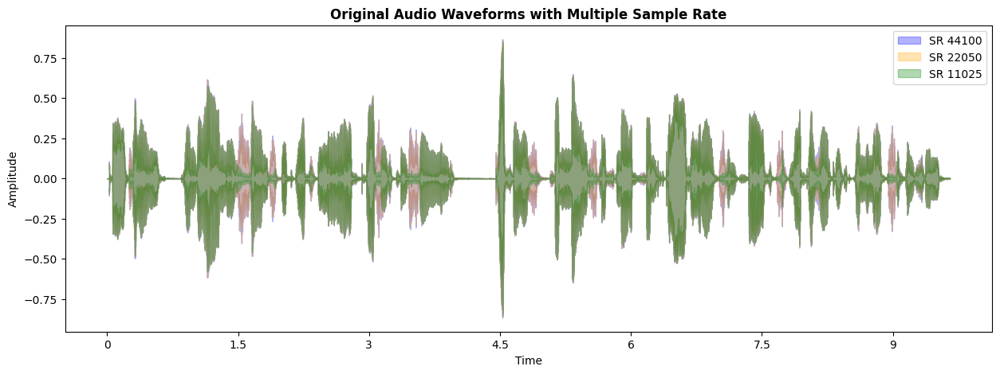

In [3]:
#load audio files 
y1,sr1 = lb.load(original[0], sr = 44100) #sample rate 44100
y2,sr2 = lb.load(original[0], sr = 22050) #sample rate 22050
y3,sr3 = lb.load(original[0], sr = 11025) #sample rate 11025

#Plot audio file
plt.figure(figsize=(15, 5))
lb.display.waveshow(y=y1, sr=sr1, color="blue", alpha = 0.3, label = 'SR 44100');
lb.display.waveshow(y=y2, sr=sr2, color="orange", alpha = 0.3, label = 'SR 22050');
lb.display.waveshow(y=y3, sr=sr3, color="green", alpha = 0.3, label = 'SR 11025');
plt.ylabel('Amplitude');
plt.title("Original Audio Waveforms with Multiple Sample Rate", weight = 'bold');
plt.legend();

2. Visualizing `Generated Audio` with Multiple Sample Rate 

We will take audio generated with `waveglow` as an example for sample rate analysis

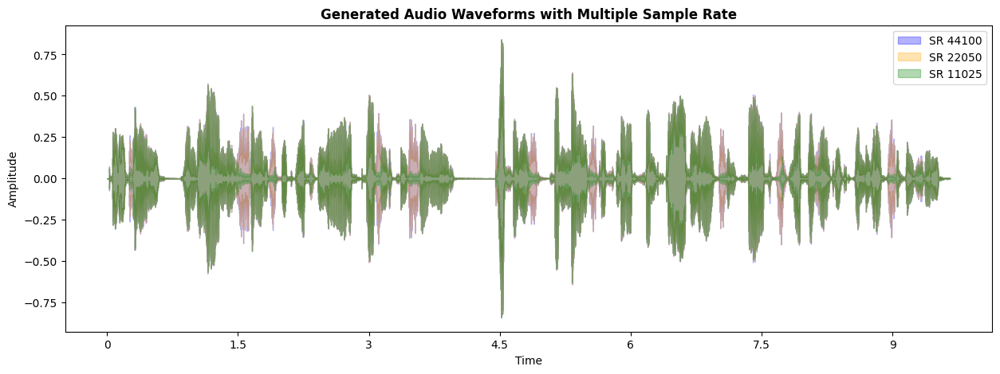

In [4]:
#load audio files 
y1,sr1 = lb.load(gen_waveglow[0], sr = 44100)
y2,sr2 = lb.load(gen_waveglow[0], sr = 22050)
y3,sr3 = lb.load(gen_waveglow[0], sr = 11025)

#Plot audio file
plt.figure(figsize=(15, 5))
lb.display.waveshow(y=y1, sr=sr1, color="blue", alpha = 0.3, label = 'SR 44100');
lb.display.waveshow(y=y2, sr=sr2, color="orange", alpha = 0.3, label = 'SR 22050');
lb.display.waveshow(y=y3, sr=sr3, color="green", alpha = 0.3, label = 'SR 11025');
plt.ylabel('Amplitude');
plt.title("Generated Audio Waveforms with Multiple Sample Rate", weight = 'bold');
plt.legend();

Looking at the waveform of original audio and generated audio, there are some details that are not captured by `sample rate 11025Hz`. Sample rate `22050Hz` and `44100Hz` shows similar details. As our intention is to get as much detail as possible to detect fake audio, we will go with `sample rate 44100Hz` to extract the features of the audio, which is a commonly used sample rate

#### **Feature Engineering**

---

We will extract the following features from the audio file 

|Feature|Description|
|---|---|
|Zero Crossing Rate|Rate at which a signal changes its sign, typically measured by counting the number of times the signal crosses the zero amplitude line within a given time frame|
|Spectral Centroid|Measure of the center of mass of the power spectrum of a signal, indicating the "average" frequency content and providing insights into the overall brightness or tonal characteristics of the signal|
|MFCC|Representation of the short-term power spectrum of a sound, capturing the spectral characteristics of audio signals by converting the frequency domain information into a compact set of coefficients|
|Delta MFCC|First-order derivatives of MFCCs, capturing the rate of change of MFCCs over time and providing additional temporal information about the spectral features of audio signals|
|Chroma Features|Represent the distribution of energy across pitch classes, providing a compact representation of the harmonic content and tonal characteristics of audio signals|

Create function to extract feature

In [5]:
#create a function to extract audio files features
def get_features(audiofiles, label):
    #create a loop to access the audio file
    audio_list = []
    mfcc_list = []
    delta_mfcc_list = []
    cf_list = []
    mfcc_name = {0: 'mfcc_1',1: 'mfcc_2',
                 2: 'mfcc_3',3: 'mfcc_4',
                 4: 'mfcc_5',5: 'mfcc_6',
                 6: 'mfcc_7',7: 'mfcc_8',
                 8: 'mfcc_9',9: 'mfcc_10',
                 10: 'mfcc_11',11: 'mfcc_12',
                 12: 'mfcc_13'}
    
    delta_mfcc_name = {0: 'd_mfcc_1',1: 'd_mfcc_2',
                       2: 'd_mfcc_3',3: 'd_mfcc_4',
                       4: 'd_mfcc_5',5: 'd_mfcc_6',
                       6: 'd_mfcc_7',7: 'd_mfcc_8',
                       8: 'd_mfcc_9',9: 'd_mfcc_10',
                       10: 'd_mfcc_11',11: 'd_mfcc_12',
                       12: 'd_mfcc_13'}
    
    cf_name = {0: 'chroma_feature_1',1: 'chroma_feature_2',2: 'chroma_feature_3',
               3: 'chroma_feature_4',4: 'chroma_feature_5',5: 'chroma_feature_6',
               6: 'chroma_feature_7',7: 'chroma_feature_8',8: 'chroma_feature_9',
               9: 'chroma_feature_10',10: 'chroma_feature_11',11: 'chroma_feature_12',
               12: 'chroma_feature_13'}
    count = 0
    for audio in audiofiles:
        y, sample_rate = lb.load(audio, sr = 44100) #sample rate choices explained above
        #extract MFCC
        mfccs = lb.feature.mfcc(y=y, sr = sample_rate, n_mfcc=13)
        mfccs_mean = np.mean(mfccs, axis = 1)
        mfcc_list.append(mfccs_mean)
        
        #extract differential of MFCC
        delta_mfccs = lb.feature.delta(mfccs)
        delta_mfccs_mean = np.mean(delta_mfccs, axis = 1)
        delta_mfcc_list.append(delta_mfccs_mean)
        
        #extract chroma features
        cf = lb.feature.chroma_stft(y=y, sr = sample_rate, n_chroma=13)
        cf_mean = np.mean(cf, axis = 1)
        cf_list.append(cf_mean)
        
        #extract zero crossing rate
        zcr = lb.feature.zero_crossing_rate(y=y)
        zcr_mean = np.mean(zcr)

        #extract spectral centroid
        sc = lb.feature.spectral_centroid(y=y)
        sc_mean = np.mean(sc)

        #create dictionary before creating Dataframe
        audio_dict = {'audio_file' : audio,
                      'label' : label,
                      'zero_crossing_rate' : zcr_mean,
                      'spectral_centroid' : sc_mean
        }
        #Note: MFCC, delta MFCC and chroma features consists of 13 column
        #Separate concat these features 
        audio_list.append(audio_dict)
        audio_df = pd.DataFrame(audio_list)
        print(f'success {count}')
        count +=1

    #create MFCC dataframe 
    mfccs_df = pd.DataFrame(mfcc_list)
    mfccs_df = mfccs_df.rename(columns = mfcc_name)

    #create Delta MFCC dataframe 
    delta_mfccs_df = pd.DataFrame(delta_mfcc_list)
    delta_mfccs_df = delta_mfccs_df.rename(columns = delta_mfcc_name)

    #create chroma feature dataframe 
    cf_df = pd.DataFrame(cf_list)
    cf_df = cf_df.rename(columns = cf_name)

    audio_df = pd.concat([audio_df, mfccs_df], axis = 1)
    #concat delta MFCC
    audio_df = pd.concat([audio_df, delta_mfccs_df], axis = 1)
    #concat chroma features 
    audio_df = pd.concat([audio_df,cf_df], axis = 1)
    
    print("sucessfully create dataframe")
    return audio_df


#### **Dataframe Creation**

Create dataframe of real audio

In [4]:
#create real audio dataframe 
real_audio = get_features(original, 'real')

Create dataframe of fake audio

In [ ]:
#create fake audio df
gen_fb_melgan_df = get_features(gen_fb_melgan,'fake')
gen_hifigan_df = get_features(gen_hifigan,'fake')
gen_melgan_df = get_features(gen_melgan, 'fake')
gen_mb_melgan_df = get_features(gen_mb_melgan, 'fake')
gen_p_wavegan_df = get_features(gen_p_wavegan, 'fake')
gen_waveglow_df = get_features(gen_waveglow,'fake')

success 0
success 1
success 2
success 3
success 4
success 5
success 6
success 7
success 8
success 9
success 10
success 11
success 12
success 13
success 14
success 15
success 16
success 17
success 18
success 19
success 20
success 21
success 22
success 23
success 24
success 25
success 26
success 27
success 28
success 29
success 30
success 31
success 32
success 33
success 34
success 35
success 36
success 37
success 38
success 39
success 40
success 41
success 42
success 43
success 44
success 45
success 46
success 47
success 48
success 49
success 50
success 51
success 52
success 53
success 54
success 55
success 56
success 57
success 58
success 59
success 60
success 61
success 62
success 63
success 64
success 65
success 66
success 67
success 68
success 69
success 70
success 71
success 72
success 73
success 74
success 75
success 76
success 77
success 78
success 79
success 80
success 81
success 82
success 83
success 84
success 85
success 86
success 87
success 88
success 89
success 90
success 9

Combine all dataframe as one 

In [ ]:
df_list = [real_audio,gen_fb_melgan_df,
           gen_hifigan_df,gen_melgan_df,
           gen_mb_melgan_df,gen_p_wavegan_df,
           gen_waveglow_df]
#create emtpy data frame
audio_df = pd.DataFrame()
#loop all df_list to combine them as one
for df in df_list:
    audio_df = pd.concat([audio_df,df], axis = 0)

Check any duplicated rows

In [40]:
audio_df.duplicated().value_counts()

False    91700
Name: count, dtype: int64

Since there is no true values, there are no duplicated rows

Check null values

This is done to check if there are any empty columns extracted from the audio. 

In [ ]:
#check the datasets, ensure to null values
audio_df.isnull().sum()

audio_file            0
label                 0
zero_crossing_rate    0
spectral_centroid     0
mfcc_1                0
mfcc_2                0
mfcc_3                0
mfcc_4                0
mfcc_5                0
mfcc_6                0
mfcc_7                0
mfcc_8                0
mfcc_9                0
mfcc_10               0
mfcc_11               0
mfcc_12               0
mfcc_13               0
d_mfcc_1              0
d_mfcc_2              0
d_mfcc_3              0
d_mfcc_4              0
d_mfcc_5              0
d_mfcc_6              0
d_mfcc_7              0
d_mfcc_8              0
d_mfcc_9              0
d_mfcc_10             0
d_mfcc_11             0
d_mfcc_12             0
d_mfcc_13             0
chroma_feature_1      0
chroma_feature_2      0
chroma_feature_3      0
chroma_feature_4      0
chroma_feature_5      0
chroma_feature_6      0
chroma_feature_7      0
chroma_feature_8      0
chroma_feature_9      0
chroma_feature_10     0
chroma_feature_11     0
chroma_feature_1

There are no empty columns on the dataset.

### **Export the csv file**

We will export out as csv file for EDA and modelling purpose.

In [ ]:
#export file to csv
audio_df.to_csv('../data/audio_file.csv', index = False)

### **2. Exploratory Data Analysis**

#### **Import Dataset**

In [3]:
#read dataset 
audio_df = pd.read_csv('../data/audio_file.csv')

Before we continue with EDA, we will convert the label of `real` and `fake` into the following: 
1. `real` = 0
2. `fake` = 1

In [4]:
#convert label to binary 
audio_df['label'] = audio_df['label'].apply(lambda x: 0 if x =='real' else 1)

In [5]:
audio_df.head()

,audio_file,label,zero_crossing_rate,spectral_centroid,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,...,chroma_feature_4,chroma_feature_5,chroma_feature_6,chroma_feature_7,chroma_feature_8,chroma_feature_9,chroma_feature_10,chroma_feature_11,chroma_feature_12,chroma_feature_13
0,c:\Users\User\GA\sandbox\capstone_project\data...,0,0.089659,1304.235799,-323.98456,110.490395,-15.569651,29.687305,-9.337172,-10.990068,...,0.321698,0.316995,0.316548,0.302425,0.274523,0.287040,0.296070,0.311789,0.331806,0.378438
1,c:\Users\User\GA\sandbox\capstone_project\data...,0,0.039649,799.118275,-343.70306,160.342900,-12.456814,16.461798,-1.550739,-12.002090,...,0.472099,0.447077,0.368103,0.304562,0.384273,0.362903,0.224810,0.212382,0.254745,0.259224
2,c:\Users\User\GA\sandbox\capstone_project\data...,0,0.093555,1297.138552,-311.03366,106.231544,-10.309275,24.133608,-11.460187,-11.904459,...,0.306986,0.329119,0.292850,0.265886,0.319642,0.348089,0.311742,0.355265,0.398820,0.364525
3,c:\Users\User\GA\sandbox\capstone_project\data...,0,0.089239,1316.380153,-353.74420,115.892930,-23.654213,33.060036,-12.907932,-9.533757,...,0.331827,0.310453,0.318776,0.314396,0.279102,0.254030,0.211233,0.242437,0.328217,0.382869
4,c:\Users\User\GA\sandbox\capstone_project\data...,0,0.072209,1167.977057,-338.63590,114.528320,-10.806395,34.839474,-0.268747,-7.760354,...,0.299801,0.330489,0.353679,0.359427,0.333285,0.280020,0.237893,0.272207,0.336213,0.351948


#### **EDA - Heatmap**


The purpose of using a heatmap in Exploratory Data Analysis (EDA) is to visually represent the correlation between variables in a dataset. By displaying the strength and direction of relationships between features, a heatmap helps identify potential multicollinearity or redundant variables. This aids in feature selection and model building by guiding decisions on which variables to include or exclude based on their interdependencies.

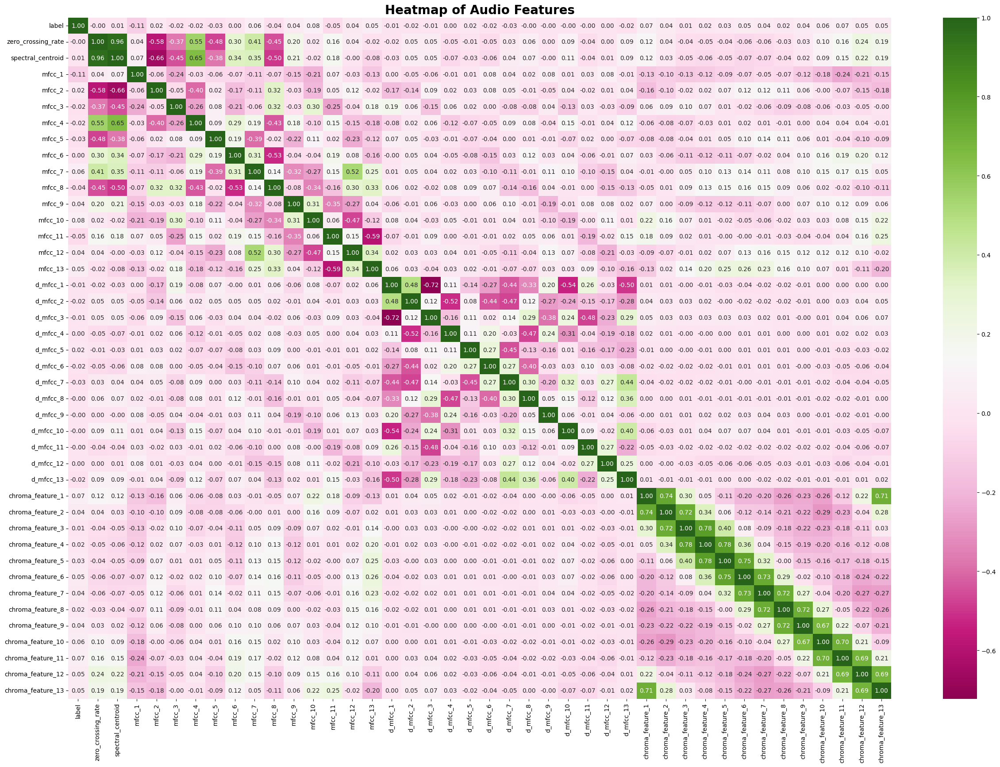

In [103]:
#set plot size
plt.figure(figsize = (30,20))

#plot heatmap
sns.heatmap(audio_df.drop(columns = 'audio_file').corr(), cmap = 'PiYG', annot = True, fmt = '.2f')
plt.title("Heatmap of Audio Features", weight = 'bold', fontsize = 20);

We will analyze the correlation between the label and other features. The heatmap reveals no significant correlations between these features and the label, which indicates that the distinction between fake and real audio may not be strongly influenced by the attributes examined. This observation suggests that each audio sample possesses unique acoustic characteristics, such as intonation, pitch, and volume, which may not align consistently with the binary classification of fake or real.

#### **EDA - Audio Duration**

We will evaluate the trend of the audio duration. We will compare if `fake` audio length distribution

In [35]:
#filter by real audio only
audio_amount = audio_df[audio_df['label'] ==0]

In [36]:
#get duration of original audio
original_duration_list = []
for audio in tqdm(audio_amount['audio_file'], desc = 'Progress'):
    y , sr = lb.load(audio, sr = 44100)
    duration = lb.get_duration(y=y, sr=sr)
    original_duration_list.append(duration)
    

Progress: 100%|██████████| 13100/13100 [01:52<00:00, 116.91it/s]


In [37]:
#get duration of each fake audio
fake_audio_amount = audio_df[audio_df['label'] ==1]
fake_duration_list = []
for audio in tqdm(fake_audio_amount['audio_file'], desc = 'Progress'):
    y , sr = lb.load(audio, sr = 44100)
    duration = lb.get_duration(y=y, sr=sr)
    fake_duration_list.append(duration)
    

Progress:   0%|          | 0/78600 [00:00<?, ?it/s]

Progress: 100%|██████████| 78600/78600 [11:07<00:00, 117.77it/s]


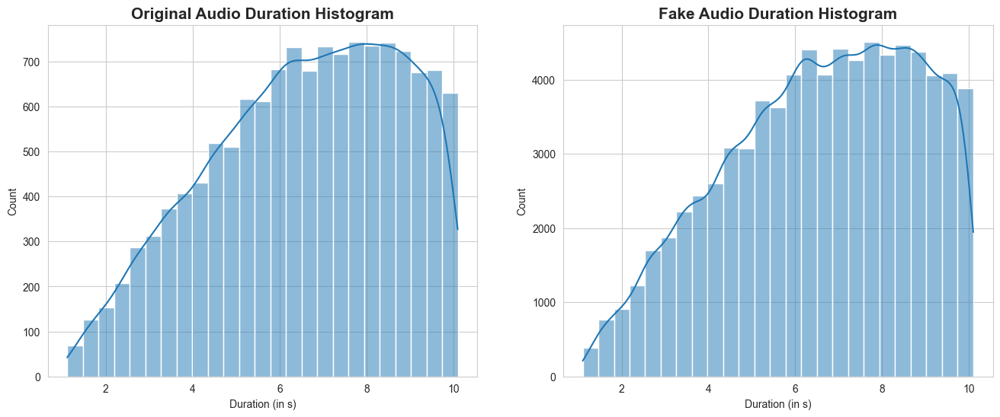

In [39]:
#plot the duration
sns.set_style('whitegrid')
fig, ax = plt.subplots(1,2,figsize = (16,6))
original_duration_series = pd.Series(original_duration_list)
fake_duration_series = pd.Series(fake_duration_list)
sns.histplot(original_duration_series, bins = 25, kde=True, ax = ax[0])
ax[0].set_title('Original Audio Duration Histogram', weight = 'bold', fontsize = 15)
ax[0].set_xlabel("Duration (in s)");

sns.histplot(fake_duration_series, bins = 25, kde=True, ax = ax[1])
ax[1].set_title('Fake Audio Duration Histogram', weight = 'bold', fontsize = 15)
ax[1].set_xlabel('Duration (in s)');

We can see that the majority of the audio duration are between 6 -10s, similar for both `real` and `fake` audio.

#### **EDA - Fake and Real Proportion**

The purpose of this visualization is to understand the proportion of the datasets

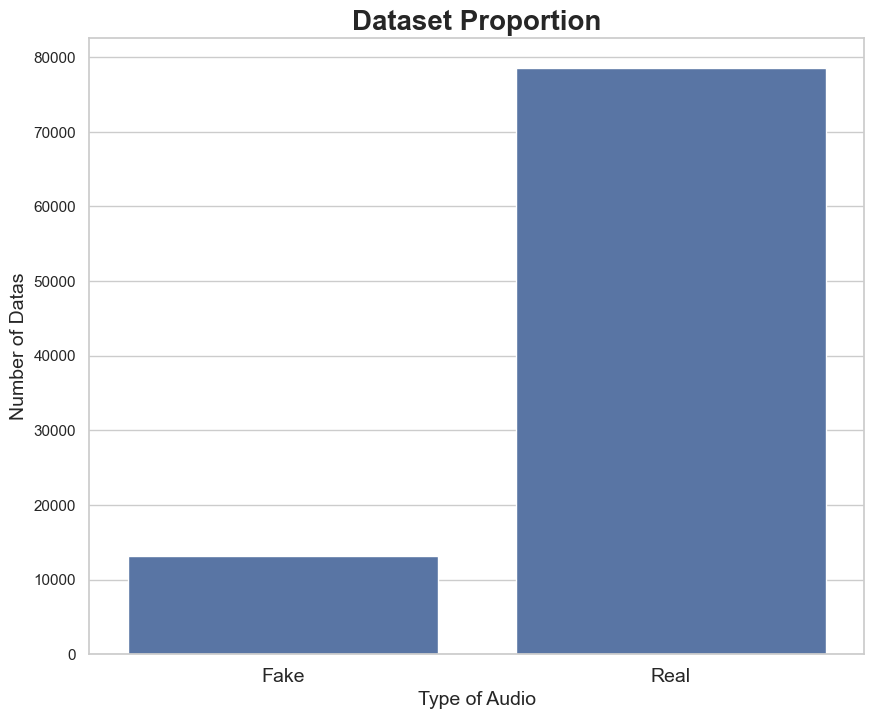

In [29]:
plt.figure(figsize=(10,8))
sns.barplot(audio_df['label'].value_counts())
plt.title("Dataset Proportion", weight = 'bold', fontsize = 20);
plt.xticks(ticks = (0,1), labels=['Fake','Real'], fontsize = 14);
plt.xlabel("Type of Audio", fontsize = 14);
plt.ylabel("Number of Datas", fontsize = 14);


Looking at the graph above, it is obvious that there are imbalanced class between the `fake` and `real` data. This is due to 6 different type of Generative Adversarial Network (GAN) architecture are used to generate the fake audio. 

The imbalanced dataset will be addressed before the baseline modelling.

#### **EDA - Fake vs Real Sound**

We will import the audio, play and listen to identify if they are distinguishable by ear. We will load one sample of `original` audio, and each of the `generated` audio from different types of generators.

*Note: Click to listen each of the audio*

In [6]:
y_ori, sr_ori = lb.load(original[0])
y_fb_melgan, sr_fb_melgan = lb.load(gen_fb_melgan[0])
y_hifi, sr_hifi = lb.load(gen_hifigan[0])
y_melgan, sr_melgan = lb.load(gen_melgan[0])
y_mb_melgan, sr_mb_melgan = lb.load(gen_mb_melgan[0])
y_p_wavegan, sr_p_wavegan = lb.load(gen_p_wavegan[0])
y_waveglow, sr_waveglow = lb.load(gen_waveglow[0])

#display original Audio
display("Original Audio: ")
display(Audio(data = y_ori, rate = sr_ori))

#display Full Band Melgan Audio
display("Generated Full Band Mel GAN Audio: ")
display(Audio(data = y_fb_melgan, rate = sr_fb_melgan))

#display HiFi GAN Audio
display("Generated HiFi GAN Audio: ")
display(Audio(data = y_hifi, rate = sr_hifi))

#display MelGAN Audio
display("Generated MelGAN Audio: ")
display(Audio(data = y_melgan, rate = sr_melgan))

#display Multi Band GAN Audio
display("Generated Multi Band GAN Audio: ")
display(Audio(data = y_mb_melgan, rate = sr_mb_melgan))

#display Parallel WaveGAN Audio
display("Generated Parallel WaveGAN Audio: ")
display(Audio(data = y_p_wavegan, rate = sr_p_wavegan))

#display waveglow Audio
display("Generated Waveglow Audio: ")
display(Audio(data = y_waveglow, rate = sr_waveglow))

'Original Audio: '

'Generated Full Band Mel GAN Audio: '

'Generated HiFi GAN Audio: '

'Generated MelGAN Audio: '

'Generated Multi Band GAN Audio: '

'Generated Parallel WaveGAN Audio: '

'Generated Waveglow Audio: '

By listening to each of the audio, `original` and `generated` audio could not be distinguished. 

#### **EDA - Fake vs Real Raw Waveform**

This part of the notebook is to visualize the difference between `fake` and `real` data by visualizing the spectogram of the audio. We will compare the original audio (`real`) to all kinds of `fake` audio by stacking the spectogram.

We will load different kind of audio files

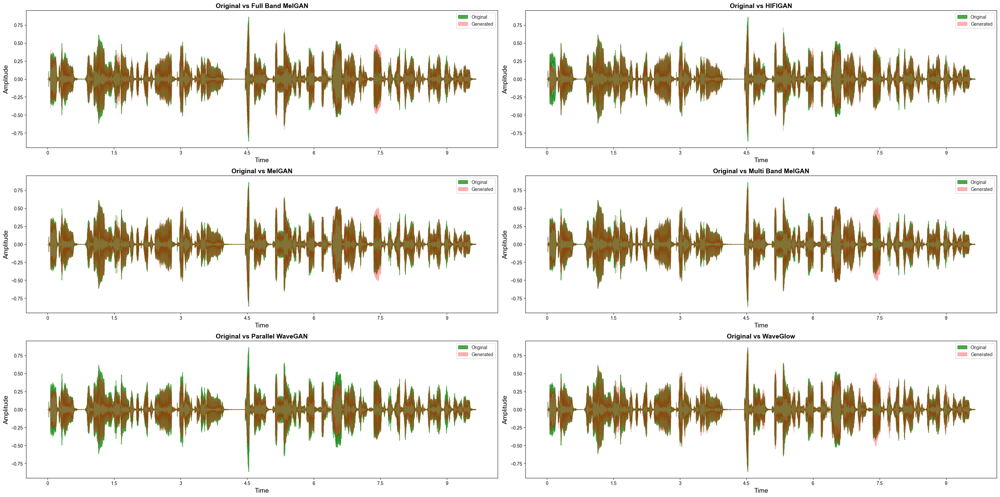

In [7]:
fig, ax = plt.subplots(3,2, figsize= (30,15))
sns.set_style('whitegrid')
#load the original audio file
y_ori, sr_ori = lb.load(original[0], sr = 44100)
#plot original audio files to add plot
x =0
y =0
for x in range(3):
    for y in range(2):
        lb.display.waveshow(y=y_ori, sr = sr_ori, color = 'green',alpha =0.7, ax=ax[x,y], label = 'Original');
        ax[x,y].set_ylabel("Amplitude", fontsize = 14)
        ax[x,y].set_xlabel("Time (in s)", fontsize = 14)
        y += 1
    x += 1

#load fb_melgan audio file
y_fb_melgan, sr_fb_melgan = lb.load(gen_fb_melgan[0], sr=44110)
lb.display.waveshow(y=y_fb_melgan, sr = sr_fb_melgan, color = 'red',alpha =0.3, ax=ax[0,0], label = 'Generated');
ax[0,0].set_title("Original vs Full Band MelGAN", fontsize = 14, weight = 'bold')
ax[0,0].legend()

#load hifigan audio file
y_hifigan, sr_hifigan = lb.load(gen_hifigan[0], sr = 44100)
lb.display.waveshow(y=y_hifigan, sr = sr_hifigan, color = 'red',alpha =0.3, ax=ax[0,1], label = 'Generated');
ax[0,1].set_title("Original vs HIFIGAN", fontsize = 14, weight = 'bold')
ax[0,1].legend()

#load melgan audio file
y_melgan , sr_melgan = lb.load(gen_melgan[0], sr= 44100)
lb.display.waveshow(y=y_melgan, sr = sr_melgan, color = 'red',alpha =0.3, ax=ax[1,0], label = 'Generated');
ax[1,0].set_title("Original vs MelGAN", fontsize = 14, weight = 'bold')
ax[1,0].legend()

#load mb melgan audio files
y_mb_melgan, sr_mb_melgan = lb.load(gen_mb_melgan[0], sr= 44100)
lb.display.waveshow(y=y_melgan, sr = sr_melgan, color = 'red',alpha =0.3, ax=ax[1,1], label = 'Generated');
ax[1,1].set_title("Original vs Multi Band MelGAN", fontsize = 14, weight = 'bold')
ax[1,1].legend()

#load parallel wavegan audio files 
y_p_wavegan, sr_p_wavegan = lb.load(gen_p_wavegan[0], sr= 44100)
lb.display.waveshow(y=y_p_wavegan, sr = sr_p_wavegan, color = 'red',alpha =0.3, ax=ax[2,0], label = 'Generated');
ax[2,0].set_title("Original vs Parallel WaveGAN", fontsize = 14, weight = 'bold')
ax[2,0].legend()

#load waveglow audio files 
y_gen_waveglow, sr_waveglow = lb.load(gen_waveglow[0], sr= 44100)
lb.display.waveshow(y=y_gen_waveglow, sr = sr_waveglow, color = 'red',alpha =0.3, ax=ax[2,1], label = 'Generated');
ax[2,1].set_title("Original vs WaveGlow", fontsize = 14, weight = 'bold');
ax[2,1].legend()

plt.tight_layout()

Based on the plot of comparing the original and the generated audio, there is no significant difference between `real` and `fake`. This could explain on why `fake` audio sounds so similar to `real` audio

#### **EDA - Fake vs Real Spectogram**

A spectrogram plots the frequency content of an audio signal as it changes over time. It allows you to see time, frequency, and amplitude all on one graph

In [41]:
#create function to plot spectrogram
def plot_spec(audio_data , ax, title):
    audio_data_spec = np.abs(lb.stft(audio_data))
    audio_data_spec_db = lb.amplitude_to_db(audio_data_spec, ref = np.max)
    
    img = lb.display.specshow(audio_data_spec_db, x_axis = 'time', y_axis = 'hz', ax = ax, cmap = 'nipy_spectral')
    ax.set_title(title, weight = 'bold', fontsize = 15)
    fig.colorbar(img, ax=ax, format="%+2.0f dB")
    ax.set_ylim(0,6000);


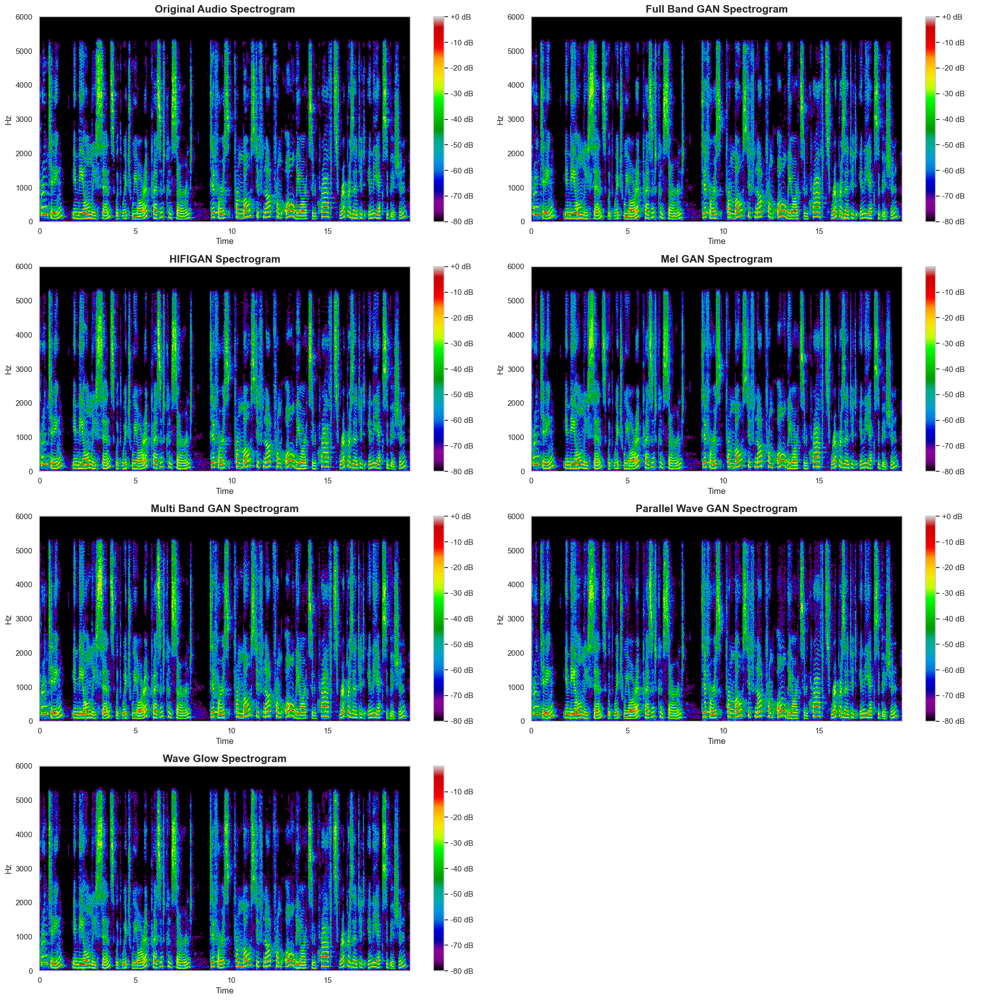

In [42]:
#plot each of the spectrogram
fig, ax = plt.subplots(4,2,figsize = (20,20))
plot_spec(y_ori, ax = ax[0,0], title = 'Original Audio Spectrogram')
plot_spec(y_fb_melgan, ax = ax[0,1], title = 'Full Band GAN Spectrogram')
plot_spec(y_hifigan, ax = ax[1,0], title = 'HIFIGAN Spectrogram')
plot_spec(y_melgan, ax = ax[1,1], title = 'Mel GAN Spectrogram')
plot_spec(y_mb_melgan, ax = ax[2,0], title = 'Multi Band GAN Spectrogram')
plot_spec(y_p_wavegan, ax = ax[2,1], title = 'Parallel Wave GAN Spectrogram')
plot_spec(y_gen_waveglow, ax = ax[3,0], title = 'Wave Glow Spectrogram')

ax[3,1].axis('off');
plt.tight_layout();


#### **EDA - Fake vs Real Mel Spectrogram**

A mel spectrogram is a variation of the spectrogram that is commonly used in speech processing and machine learning tasks. It is similar to a spectrogram in that it shows the frequency content of an audio signal over time, but on a different frequency axis.

Unlike traditional spectrograms, which display frequencies linearly, Mel spectrograms use the Mel scale to better approximate human auditory perception. This scale emphasizes lower frequencies, mimicking how our ears process sound, making Mel spectrograms useful in tasks like speech recognition and audio processing.

In [16]:
#create function to plot mel-spectrogram

def plot_mel_spec(audio_data, sr, ax, title):
    #extract features
    audio_data_mel_spec = lb.feature.melspectrogram(y = audio_data, sr = sr,  n_mels=128)
    audio_data_spec_db = lb.power_to_db(audio_data_mel_spec, ref = np.max)
    
    #display plot
    img = lb.display.specshow(audio_data_spec_db, x_axis = 'time', y_axis = 'mel', ax = ax, cmap = 'nipy_spectral')
    ax.set_title(title, weight = 'bold', fontsize = 14)
    fig.colorbar(img, ax=ax, format="%+2.0f dB")
    ax.set_ylim(0,7000);

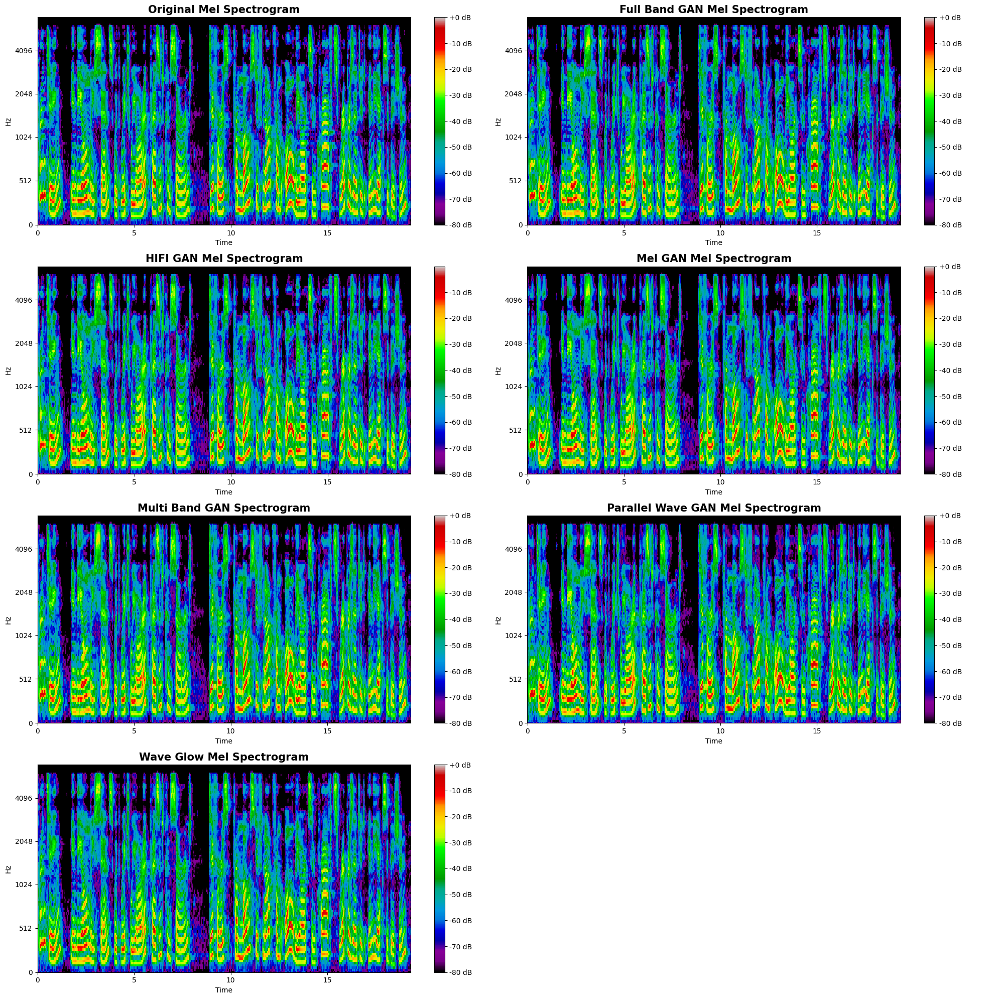

In [10]:
#plot mel spectrogram
fig, ax = plt.subplots(4,2, figsize = (20,20))

plot_mel_spec(y_ori, sr = sr_ori, ax = ax[0,0], title = 'Original Mel Spectrogram')
plot_mel_spec(y_fb_melgan, sr = sr_fb_melgan, ax = ax[0,1], title = 'Full Band GAN Mel Spectrogram')
plot_mel_spec(y_hifigan, sr = sr_hifigan, ax = ax[1,0], title = 'HIFI GAN Mel Spectrogram')
plot_mel_spec(y_melgan, sr = sr_melgan, ax=ax[1,1], title = "Mel GAN Mel Spectrogram")
plot_mel_spec(y_mb_melgan, sr = sr_mb_melgan, ax = ax[2,0], title = "Multi Band GAN Spectrogram")
plot_mel_spec(y_p_wavegan, sr = sr_p_wavegan, ax = ax[2,1], title = "Parallel Wave GAN Mel Spectrogram")
plot_mel_spec(y_gen_waveglow, sr = sr_waveglow, ax = ax[3,0], title = 'Wave Glow Mel Spectrogram')

ax[3,1].axis('off');
plt.tight_layout();

Based on the spectogram, we can see that the `original` audio and the generated `fake` audio have very similar plot. Visually, it is very hard to identify the difference between `original` and `fake`. Visually are minor difference between the `original` and `fake` which explains that they are very identical by listening them through physical ear

#### **EDA - Fake vs Real Mel Spectogram Difference**

--- 

Visually, there are no significant difference between the `original` and `generated` audio mel-spectrogram. We will attempt to plot the differences to visualize how python identify the differences.

In [51]:
#create function to plot
def difference_plot(original_audio, fake_audio, plot_title , ax, sr = 44100):
    original = lb.feature.melspectrogram(y = original_audio, sr = sr)
    fake = lb.feature.melspectrogram(y=fake_audio, sr=sr)
    log_original = lb.power_to_db(original, ref = np.max)
    log_fake = lb.power_to_db(fake, ref=np.max)

    min_time = min(log_original.shape[1], log_fake.shape[1])
    log_original = log_original[:, :min_time]
    log_fake = log_fake[:, :min_time]

    # plt.figure(figsize = (8,4))
    diff = np.abs(log_original - log_fake)
    img = lb.display.specshow(diff, x_axis = 'time', y_axis = 'mel', cmap = 'nipy_spectral', ax = ax);
    fig.colorbar(img, ax=ax, format="%+2.0f dB");
    ax.set_title(plot_title, weight = 'bold', fontsize = 14);
    ax.set_ylim(0,8000)

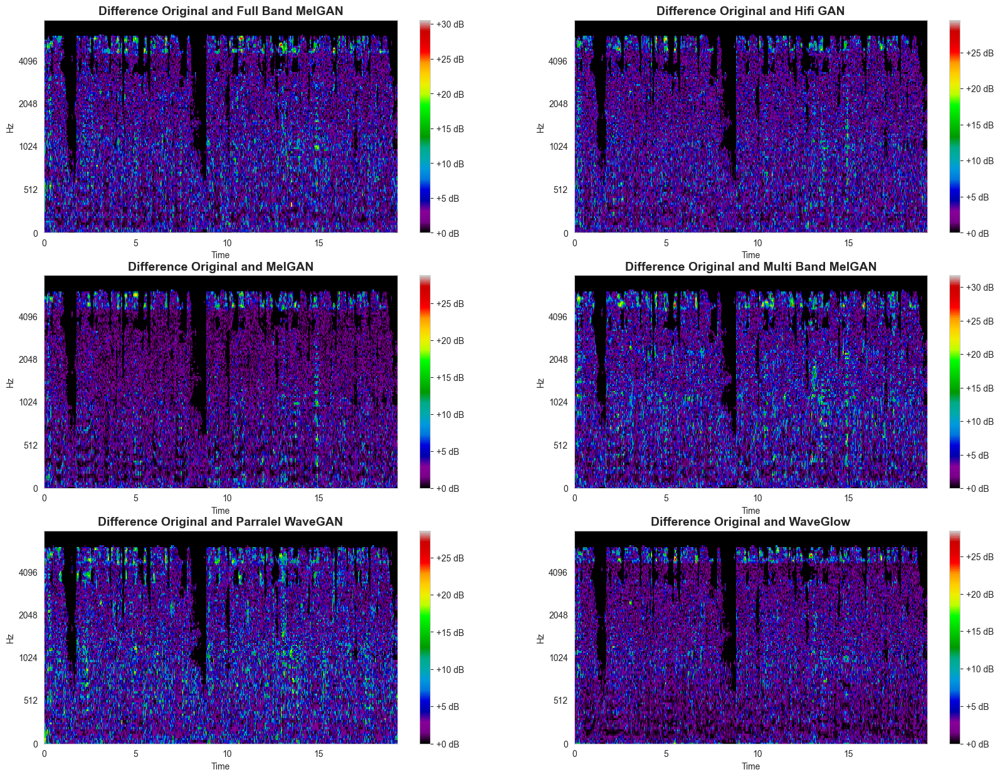

In [52]:
fig , ax = plt.subplots(3,2, figsize = (20,15))

difference_plot(y_ori, y_fb_melgan, plot_title= "Difference Original and Full Band MelGAN", ax = ax[0,0])
difference_plot(y_ori, y_hifigan, plot_title= "Difference Original and Hifi GAN", ax = ax[0,1])
difference_plot(y_ori, y_melgan, plot_title= "Difference Original and MelGAN", ax = ax[1,0])
difference_plot(y_ori, y_mb_melgan, plot_title= "Difference Original and Multi Band MelGAN", ax = ax[1,1])
difference_plot(y_ori, y_p_wavegan, plot_title= "Difference Original and Parralel WaveGAN", ax = ax[2,0])
difference_plot(y_ori, y_gen_waveglow, plot_title= "Difference Original and WaveGlow", ax = ax[2,1])

Based on the differences identified using Python, we can observe that throughout the entire mel spectrogram, there are distinctions between the original and generated audio. Moreover, each difference displays a unique plot pattern.

#### **EDA - Fake vs Real MFCC**

---


MFCC, or Mel-Frequency Cepstral Coefficients, are a feature extraction technique used in speech and audio signal processing. They represent the short-term power spectrum of a sound by extracting features that mimic the human auditory system's response to sound. They are able to capture key characteristics such as timbre and pitch 

In [24]:

def plot_mfcc(audio_data, sr, ax, title):
    #extract feature
    audio_mfcc = lb.feature.mfcc(y=audio_data, sr= sr)
    
    # audio_mfcc = scale(audio_mfcc, axis=1)
    #display plot 
    img = lb.display.specshow(audio_mfcc, x_axis='time', y_axis = 'mel', cmap = 'Spectral', ax = ax)
    ax.set_title(title, weight = 'bold', fontsize = 15)
    fig.colorbar(img);

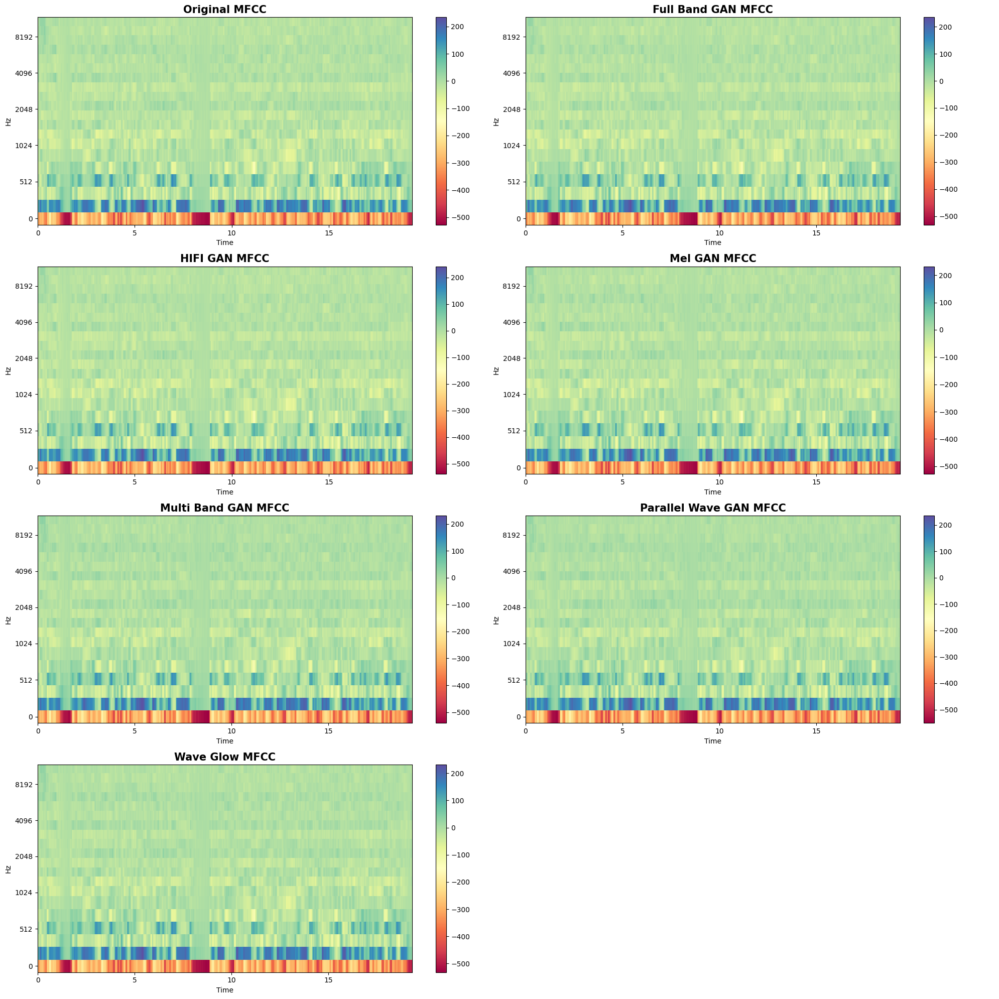

In [25]:
#plot mfcc
fig, ax = plt.subplots(4,2, figsize = (20,20))

plot_mfcc(y_ori, sr = sr_ori, ax = ax[0,0], title = 'Original MFCC')
plot_mfcc(y_fb_melgan, sr = sr_fb_melgan, ax = ax[0,1], title = 'Full Band GAN MFCC')
plot_mfcc(y_hifigan, sr = sr_hifigan, ax = ax[1,0], title = 'HIFI GAN MFCC')
plot_mfcc(y_melgan, sr = sr_melgan, ax=ax[1,1], title = "Mel GAN MFCC")
plot_mfcc(y_mb_melgan, sr = sr_mb_melgan, ax = ax[2,0], title = "Multi Band GAN MFCC")
plot_mfcc(y_p_wavegan, sr = sr_p_wavegan, ax = ax[2,1], title = "Parallel Wave GAN MFCC")
plot_mfcc(y_gen_waveglow, sr = sr_waveglow, ax = ax[3,0], title = 'Wave Glow MFCC')

ax[3,1].axis('off');
plt.tight_layout();

Plotting the spectrogram of the MFCCs, there are no obvious insights from it. We can see the patterns looks very similar, which could imply the reason that the `original` and `generated` audio sounds very similar
We will look into the wave plot to further evaluate

The function below is to create waveform plot of MFCC

In [49]:
#create function to plot waveform
def plot_mfcc(audio_data_ori,audio_data_fake, sr, ax, title):
    #extract features
    mfcc_ori = lb.feature.mfcc(y=audio_data_ori, sr= sr)
    mfcc_fake = lb.feature.mfcc(y=audio_data_fake, sr= sr)

    #Plot Original MFCCs
    ax.plot(mfcc_ori.T, color='blue', alpha=0.7, label = 'Original')

    # Plot Full band GAN MFCCs
    ax.plot(mfcc_fake.T, color='red', alpha=0.7, label = "Generated")

    ax.set_ylim(-550, -150)
    ax.set_xlim(0, 50)  # Adjust x-axis limit as per your requirement
    ax.set_xlabel('Frame')
    ax.set_ylabel('MFCC Value')
    ax.set_title(title, weight = 'bold', fontsize = 15)
    ax.legend()

    #set legend
    handles, labels = ax.get_legend_handles_labels()
    unique_labels = list(set(labels))
    legend = ax.legend(handles[:2], unique_labels[:2])
    legend.get_lines()[1].set_color('red')

    

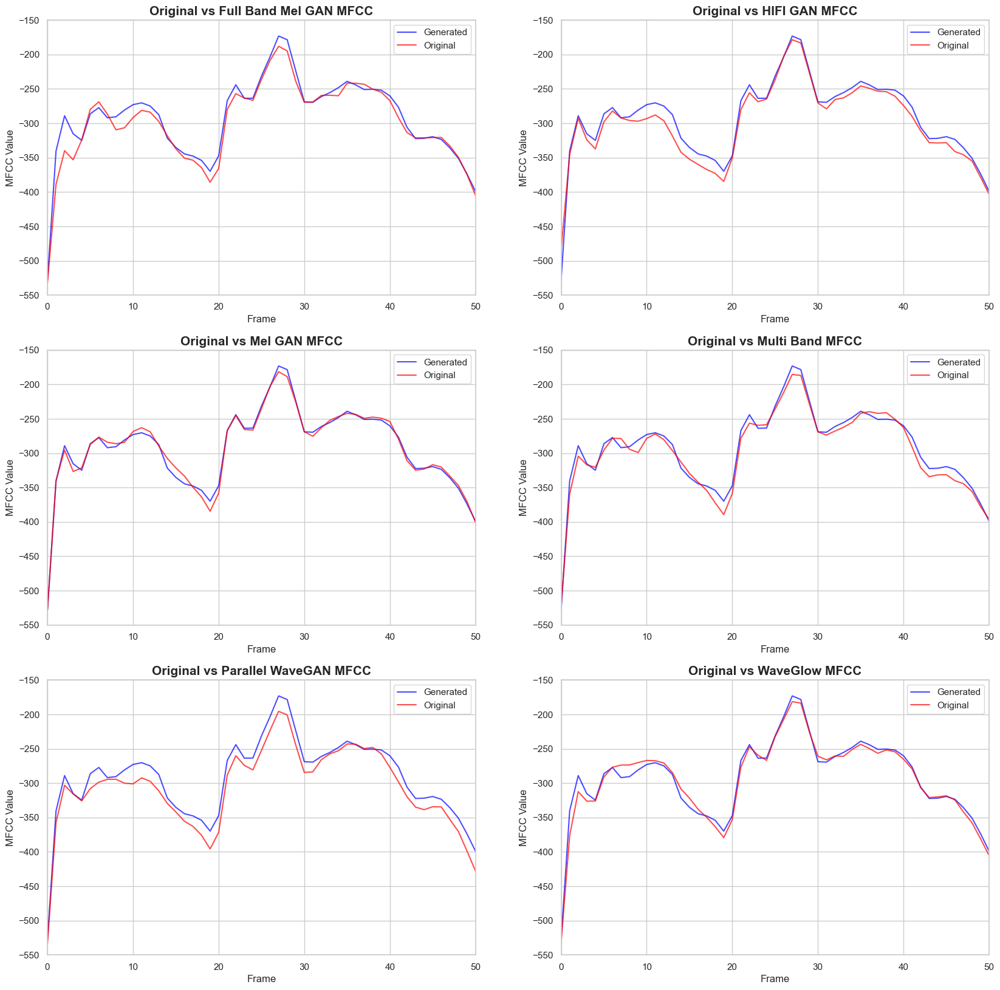

In [50]:
#stack plot between original and generated audio
#define subplot 
fig, ax = plt.subplots(3,2, figsize = (20,20))

#plot original vs generated
plot_mfcc(y_ori,y_fb_melgan, sr = 44100, ax = ax[0,0], title = "Original vs Full Band Mel GAN MFCC")
plot_mfcc(y_ori,y_hifigan, sr = 44100, ax = ax[0,1], title = "Original vs HIFI GAN MFCC")
plot_mfcc(y_ori,y_melgan, sr = 44100, ax = ax[1,0], title = "Original vs Mel GAN MFCC")
plot_mfcc(y_ori,y_mb_melgan, sr = 44100, ax = ax[1,1], title = "Original vs Multi Band MFCC")
plot_mfcc(y_ori,y_p_wavegan, sr = 44100, ax = ax[2,0], title = "Original vs Parallel WaveGAN MFCC")
plot_mfcc(y_ori,y_gen_waveglow, sr = 44100, ax = ax[2,1], title = "Original vs WaveGlow MFCC")

From the wave plot, it's evident that there are subtle distinctions between the `original` audio and each `generated` audio. Analyzing Mel-frequency cepstral coefficients (MFCC) could offer valuable insights into distinguishing real from fake audio. Depending on the specific type of Generative Adversarial Network (GAN) employed to generate the `fake` audio, each GAN produces its own distinct audio signature. Consequently, it's crucial to aggregate samples from all GANs and feed them into our model to accurately predict whether an audio clip is `real` or `fake`.

On the next notebook, we will begin the create classification model to predict if an audio is fake or not, using the traditional classification model.

---

Next: [`02 Baseline Modelling`](02_baseline_modelling.ipynb)